In [1]:
## Importing necessary libraries

import numpy as np
from astropy.io import fits
from pathlib import Path
from matplotlib.colors import LogNorm
from astropy.nddata import CCDData
from itertools import cycle
from ccdproc import ImageFileCollection
import ccdproc as ccdp
import os
from astropy.stats import mad_std,sigma_clipped_stats, SigmaClip
import ccdproc as ccdp
import matplotlib.pyplot as plt
#from convenience_functions import show_image
from matplotlib.colors import LogNorm
import astropy.units as u
import glob
import photutils as pht
from photutils.background import Background2D, MedianBackground
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint
from scipy.stats import median_abs_deviation as mad

In [2]:
#I created a function that gives the fits file median
def view_median_fits(fits_file):
    with fits.open(fits_file) as hdulist:
        data=hdulist[0].data
        median=np.median(data)
        print(f"Median of the FITS file: {median}")

In [3]:
#Used as a scaling function when combining flat frames (scale=inv_median in ccdp.combine).
#Ensures flats are normalized by their median brightness before stacking, preventing over/under-exposed frames from dominating the final master flat.

#Now you should create a master flat like the master dark we created before.
def inv_median(a):
    return 1 / np.median(a)
from pathlib import Path
flatpath=Path (r'C:/Users/sarin/flat')

combined_path_flat = Path(r'C:/Users/sarin/OneDrive/Desktop/combinedflat')
combined_flat_name = 'master_flat_trimonly.fits'

combined_flat_file = combined_path_flat/ combined_flat_name
if combined_flat_file.exists():
    # Read the existing combined flat file as a CCDData object
    combined_flat = CCDData.read(combined_flat_file) 
    print(f"File already exists: {combined_flat_file}")  # Print the message
else:
    # Perform the combination if the file doesn't exist
    to_combine = glob.glob(str(combined_path / 'dark_removed*'))
    # Check if any files were found
    if not to_combine:
        print("No files found to combine for combined_flat")
    else:
        # Combine the files
        combined_flat = ccdp.combine(to_combine,method='median', scale=inv_median,
                                    sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                    sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std,
                                    mem_limit=350e6)
        combined_flat.meta['combined'] = True
        combined_flat.write(combined_path / combined_flat_name, overwrite=True)

File already exists: C:\Users\sarin\OneDrive\Desktop\combinedflat\master_flat_trimonly.fits


C:\Users\sarin\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\_function_base_impl.py:4842: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(


NameError: name 'ax2' is not defined

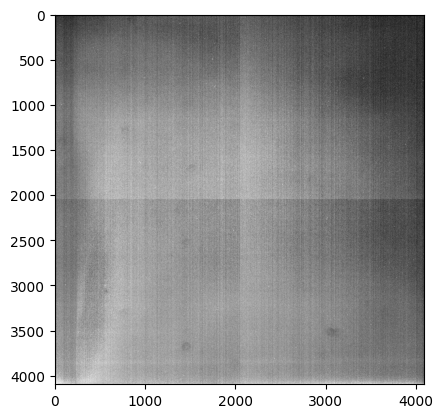

In [4]:
# Plotting:



plt.imshow(combined_flat,cmap='gray', vmin=np.percentile(combined_flat, 5), vmax=np.percentile(combined_flat, 95))
#ax2.imshow(combined_flat, vmin=50, vmax=90, origin='lower')

ax2.set_title('Combined Flats with Dark reduced_scale: inv_median',fontsize=20)
#fig.savefig("WASP12b-flat2_scale_inv_median.png")

In [29]:
#Subtracting the master dark and flat from a light Frame
path = Path(r'C:/Users/sarin')
light_frame_name='star6-2024_09_11-exp00.00.30.000-000019_High_1.fit'
combined_dark=r'C:/Users/sarin/OneDrive/Desktop/combined/master_dark_trimonly.fits'
combined_dark = CCDData.read(combined_dark, unit='adu')

INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]


In [31]:
raw_data = CCDData.read(path.joinpath(light_frame_name), unit='adu')
# Bin the raw frame by 2x2 (4096→2048)
from astropy.nddata import block_reduce
import numpy as np
binned_raw_data = block_reduce(raw_data.data, block_size=(2, 2), func=np.mean)
binned_raw = CCDData(binned_raw_data, unit=raw_data.unit, meta=raw_data.meta)
reducedark = ccdp.subtract_dark(binned_raw, combined_dark,exposure_time='EXPTIME', exposure_unit=u.second)


In [36]:
binned_flat = block_reduce(combined_flat.data, block_size=(2, 2), func=np.mean)
binned_flat = CCDData(binned_flat, unit=combined_flat.unit, meta=combined_flat.meta)
reducefd = ccdp.flat_correct(binned_raw, binned_flat)
# Check if output files already exist
combined_path =  Path(r'C:\Users\sarin\OneDrive\Desktop\combined_path')



In [39]:
# Check if output files already exist
file_name = Path(light_frame_name).name
output_files = [
    combined_path / ('light_minus_dark_only' + file_name),
    combined_path / ('light_div_falt_minus_dark' + file_name)
]


File already exists: C:\Users\sarin\OneDrive\Desktop\combined_path\light_minus_dark_onlystar6-2024_09_11-exp00.00.30.000-000019_High_1.fit
File already exists: C:\Users\sarin\OneDrive\Desktop\combined_path\light_div_falt_minus_darkstar6-2024_09_11-exp00.00.30.000-000019_High_1.fit


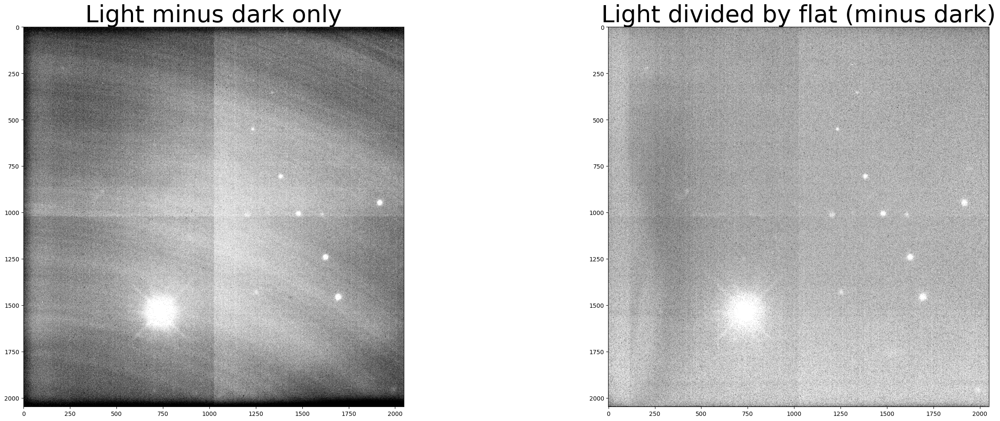

In [42]:
for output_file in output_files:
    if output_file.exists():
        print(f"File already exists: {output_file}")
    else:
        # Write the output to a file
        if output_file.name == ('light_minus_dark_only' + file_name):
            reducedark.write(output_file, overwrite=True)
        elif output_file.name == ('light_div_falt_minus_dark' + file_name):
            reducefd.write(output_file, overwrite=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

# Display images using ax.imshow() instead of plt.imshow()
ax1.imshow(reducedark, cmap='gray', vmin=np.percentile(reducedark, 5), vmax=np.percentile(reducedark, 95))
ax1.set_title('Light minus dark only', fontsize=40)

ax2.imshow(reducefd, cmap='gray', vmin=np.percentile(reducefd, 5), vmax=np.percentile(reducefd, 95))
ax2.set_title('Light divided by flat (minus dark)', fontsize=40)

plt.tight_layout()
plt.show()

In [48]:
# Veiwing Statistics:
import pandas as pd
from astropy.stats import biweight_location, sigma_clipped_stats
means, medians, stds = sigma_clipped_stats(reducefd, sigma=3.0)

In [54]:
lights = {
    'Data Set': ['light_div_falt_minus_dark'],
    'Mean': [means],
    'Median': [medians],
    'Standard Deviation': [stds]
}


In [55]:
df = pd.DataFrame(lights)
print(df.to_string(index=False))  # Print the DataFrame as a table


                 Data Set       Mean     Median  Standard Deviation
light_div_falt_minus_dark 109.685308 109.621743             4.40091


In [58]:
## STEP 5. Source Detection and Masking for creating 2D bkgd 

## Defining Masks

## Sigma_clipping is: pixels that are above or below a specified sigma level from the median are discarded 
## and the statistics are recalculated.
## reduceflat is light minus flat only
comb_flat = CCDData.read(combined_flat_file)
### Light minus Flat only ###
reduceflat = ccdp.flat_correct(raw_data, comb_flat)
sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
threshold = detect_threshold(reduceflat.data, nsigma=5, sigma_clip=sigma_clip)
segment_img = detect_sources(reduceflat.data, threshold, npixels=10)
footprint = circular_footprint(radius=3)
maskd = segment_img.make_source_mask(footprint=footprint)

## reduce is light div combined flat minus dark
thresholds = detect_threshold(reducefd.data, nsigma=5, sigma_clip=sigma_clip)
segment_imgs = detect_sources(reducefd.data, thresholds, npixels=10)
footprints = circular_footprint(radius=3)
masks = segment_img.make_source_mask(footprint=footprints)


Text(0.5, 1.0, 'reducefd_mask|threshold_nsigma3.0|footprint_radius5 ')

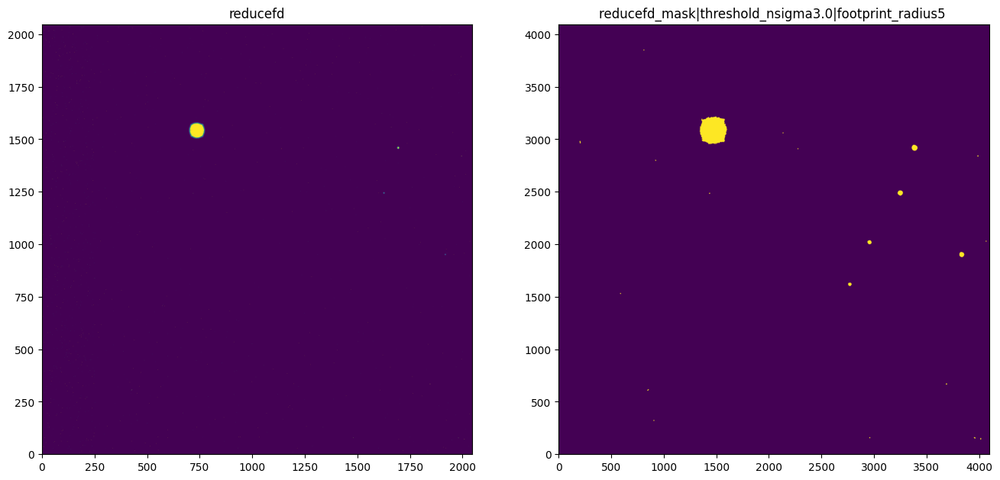

In [59]:
# Plotting the mask

f,axs=plt.subplots(1,2,figsize=(16,8))
axs[0].imshow(reducefd,vmin=300,vmax=600,origin='lower')
axs[0].set_title("reducefd")
axs[1].imshow(masks,origin='lower')
axs[1].set_title("reducefd_mask|threshold_nsigma3.0|footprint_radius5 ")
#f.savefig("mask1.png")

In [60]:
## STEP 6. Background estimation:

# We start by creating a Background2D object using a box size of50x50 and a 3x3 filter. We will estimate the 
## background level in each mesh as the sigma-clipped median using an instance of Median Background

## what is 50x50-> This pair of numbers represents the size of the block used for calculating the background. In this case, it’s a square block with a width and height of 50 pixels.
## what is filter_size=(3,3): This parameter determines the size of a smoothing filter applied to the calculated background image


In [74]:
## the following is for reduce which is light div combined flat minus dark
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
import numpy as np

# Create mask (if needed)
mask = np.zeros_like(reducefd.data, dtype=bool)  # Example blank mask

# Initialize background estimators
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()

# Calculate background
bkgs = Background2D(
    reducefd.data, 
    box_size=(50, 50),
    mask=mask,
    filter_size=(3, 3),
    sigma_clip=sigma_clip,
    bkg_estimator=bkg_estimator
)
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
import numpy as np

# Create mask (if needed)
mask = np.zeros_like(reduceflat.data, dtype=bool)  # Example blank mask

# Initialize background estimators
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()

# Calculate background
bkg = Background2D(
    reduceflat.data, 
    box_size=(50, 50),
    mask=mask,
    filter_size=(3, 3),
    sigma_clip=sigma_clip,
    bkg_estimator=bkg_estimator
)



bgktable = {
    'Data Set': ['light div combined flat only', 'light div combined flat minus dark'],
    'Background Median': [bkg.background_median, bkgs.background_median],
    'Background RMS Median': [bkg.background_rms_median, bkgs.background_rms_median]
}

df = pd.DataFrame(bgktable)

print(df.to_string(index=False))  # Print the DataFrame as a table

                          Data Set  Background Median  Background RMS Median
      light div combined flat only         109.328112               7.441691
light div combined flat minus dark         109.396189               3.811800


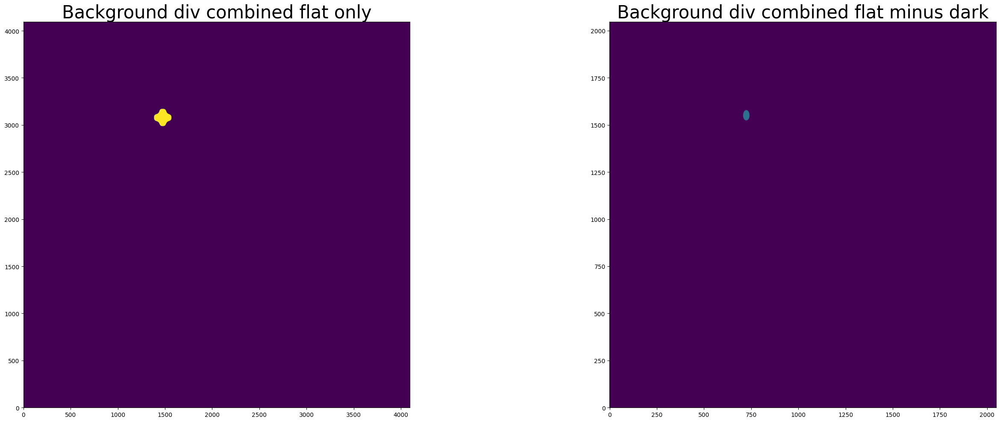

In [75]:

## Plotting:
# Use the following line to find estimates for vmin and vmax
#show_image(bkg.background, cmap='gray', percl=90)

figs, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

ax1.imshow(bkg.background, vmin=235, vmax=255, origin='lower')
ax1.set_title('Background div combined flat only',fontsize=30)

ax2.imshow(bkgs.background, vmin=235, vmax=255, origin='lower')
ax2.set_title('Background div combined flat minus dark',fontsize=30)
plt.tight_layout()
#figs.savefig("Wasp12b-2D_bckg_comparison2.png")

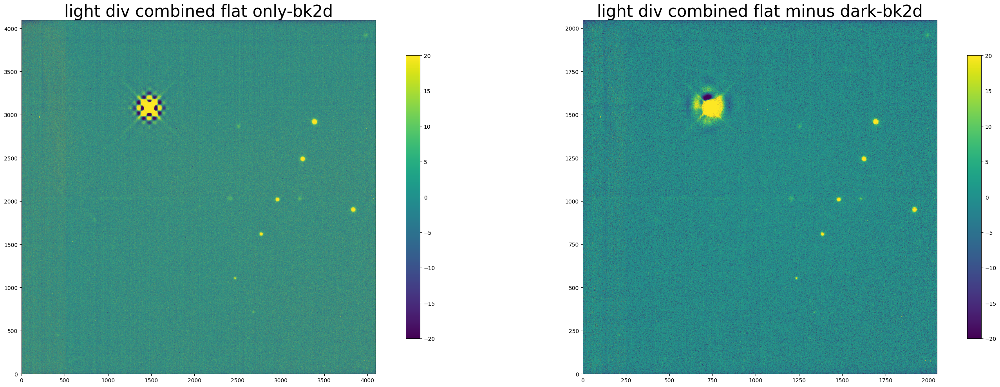

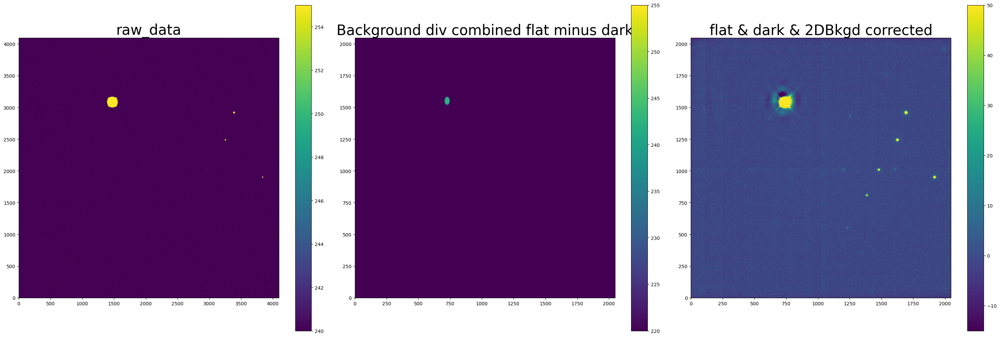

In [76]:
## STEP 7. Subtracting Background

#show_image(raw_data, cmap='gray',percl=90)
#show_image(reducefd.data- bkgs.background, cmap='gray',percl=90)

figd, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
im1 = ax1.imshow(reduceflat.data - bkg.background, vmin=-20, vmax=20, origin='lower')
ax1.set_title('light div combined flat only-bk2d', fontsize=30)
im2 = ax2.imshow(reducefd.data - bkgs.background, vmin=-20, vmax=20, origin='lower')
ax2.set_title('light div combined flat minus dark-bk2d', fontsize=30)

# Add colorbars
figd.colorbar(im1, ax=ax1, orientation='vertical', shrink=0.8)
figd.colorbar(im2, ax=ax2, orientation='vertical', shrink=0.8)

plt.tight_layout()
plt.show()
#figd.savefig("030421_Wasp12b_calibration_v2.png")


figy, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))
iu1 = ax1.imshow(raw_data, vmin=240, vmax=255, origin='lower')
ax1.set_title('raw_data', fontsize=30)
iu2 = ax2.imshow(bkgs.background, vmin=220, vmax=255, origin='lower')
ax2.set_title('Background div combined flat minus dark', fontsize=30)
iu3 = ax3.imshow(reducefd.data - bkgs.background, vmin=-15, vmax=50, origin='lower')
ax3.set_title('flat & dark & 2DBkgd corrected', fontsize=30)


# Add colorbars
figy.colorbar(iu1, ax=ax1, orientation='vertical')
figy.colorbar(iu2, ax=ax2, orientation='vertical')
figy.colorbar(iu3, ax=ax3, orientation='vertical')
#figy.colorbar(iu3, ax=ax3, orientation='vertical', shrink=0.7)

plt.tight_layout()
plt.show()
#figy.savefig("Wasp12b-flat2-fld2Dbkg.png")

In [100]:
## STEP 8. Writing the cleaned light frame to calibrated folder
light_frame_base = light_frame_name.rsplit('.', 1)[0]  # Gets filename without extension
print(light_frame_base)
calibrated_path = Path(r'C:\Users\sarin\OneDrive\Desktop\calibrated')

# Process flat-only version
from astropy.nddata import block_reduce
import numpy as np

# ... [previous code] ...

# Bin the background to match
binned_background = block_reduce(bkg.background, block_size=(2, 2), func=np.mean)

flatonly = reduceflat.data - binned_background

flatonly_ccd = CCDData(data=flatonly, header=raw_data.header, unit=raw_data.unit)
fits.writeto(calibrated_path / output_fdname, flatonly_ccd.data, 
            header=flatonlyk_ccd.header, overwrite=True)
flatanddark = reducefd.data - binned_background
flatanddark_ccd = CCDData(data=flatanddark, header=raw_data.header, unit=raw_data.unit)
output_fdname = f"{light_frame_base}_{calibrated_darkandflat}"
fits.writeto(calibrated_path / output_fdname, flatanddark_ccd.data, 
            header=flatanddark_ccd.header, overwrite=True)


star6-2024_09_11-exp00.00.30.000-000019_High_1


ValueError: operands could not be broadcast together with shapes (4096,4096) (2048,2048) 

In [ ]:
## STEP 9. Performing all the above tasks for all light frames

# Read the combined flat frame
comb_flat = CCDData.read(combined_flat_file)

files = ccdp.ImageFileCollection(path)
light_frame_files = files.files_filtered(include_path=True, OBSTYPE='object')

for light_frame_file in light_frame_files:  # Assuming the light frame files are .fits

    raw_data = CCDData.read(light_frame_file, unit='adu')

    # Performing subtraction of dark from light
    reducedark = ccdp.subtract_dark(raw_data, combined_dark, exposure_time='EXPTIME', exposure_unit=u.second)
/
    # Light minus Flat and Dark
    reducefd = ccdp.flat_correct(reducedark, comb_flat)

    # Prepare output filenames
    file_path = Path(light_frame_file)
    file_name = file_path.stem
    output_light_minus_dark = combined_path / (f'light_minus_dark_only_{file_name}.fits')
    output_light_div_flat_minus_dark = combined_path / (f'light_div_flat_minus_dark_{file_name}.fits')

    # Check if output files already exist
    if output_light_minus_dark.exists():
        print(f"File already exists: {output_light_minus_dark}")
    else:
        reducedark.write(output_light_minus_dark, overwrite=True)

    if output_light_div_flat_minus_dark.exists():
        print(f"File already exists: {output_light_div_flat_minus_dark}")
    else:
        reducefd.write(output_light_div_flat_minus_dark, overwrite=True)

    # Source Detection and Masking for creating 2D background
    sigma_clip = SigmaClip(sigma=3.0, maxiters=10)

    # Thresholding for light minus flat only (reduceflat)
    reduceflat = ccdp.flat_correct(raw_data, comb_flat)
    threshold_flat = detect_threshold(reduceflat.data, nsigma=5, sigma_clip=sigma_clip)
    segment_img_flat = detect_sources(reduceflat.data, threshold_flat, npixels=10)
    footprint_flat = circular_footprint(radius=3)
    mask_flat = segment_img_flat.make_source_mask(footprint=footprint_flat)

    # Thresholding for light div flat minus dark (reducefd)
    threshold_fd = detect_threshold(reducefd.data, nsigma=5, sigma_clip=sigma_clip)
    segment_img_fd = detect_sources(reducefd.data, threshold_fd, npixels=10)
    footprint_fd = circular_footprint(radius=3)
    mask_fd = segment_img_fd.make_source_mask(footprint=footprint_fd)

    # Background Estimation for light div flat minus dark (reducefd)
    bkg_estimators = MedianBackground()
    bkg_fd = Background2D(reducefd.data, (50, 50), mask=mask_fd, filter_size=(3, 3), 
                          sigma_clip=sigma_clip, bkg_estimator=bkg_estimators)

    # Subtracting Background
    flatanddark = reducefd.data - bkg_fd.background
    flatanddark_ccd = CCDData(data=flatanddark, header=raw_data.header, unit=raw_data.unit)

    # Writing the output to a new file
    calibrated_darkandflat = f"{file_name}_calibrated_darkandflat.fits"
    output_fdname = calibrated_path / calibrated_darkandflat
    fits.writeto(output_fdname, flatanddark_ccd.data, header=flatanddark_ccd.header, overwrite=True)

    print(f"Processed and saved {output_fdname}")